### 🧬 Breast Cancer Prediction Dataset (marshalpatel3558 on Kaggle)

- **Dataset purpose**: Supervised binary classification to predict whether a patient is **alive** or **dead** based on clinical and pathological features.
  
- **Data origin**:  
  Released under MIT License  
  Copyright (c) 2013 Mark Otto.  
  Copyright (c) 2017 Andrew Fong.  


- **Number of samples (rows)**: 4,024 patient records.

---

### 🔍 Features (columns)

| Column Name              | Description                                                        | Example Values                        |
|--------------------------|--------------------------------------------------------------------|---------------------------------------|
| Age                      | Age of the patient at diagnosis (years)                           | 68, 50, 58                            |
| Race                     | Ethnicity of the patient                                           | White, Black, Other                   |
| Marital Status           | Marital status at time of diagnosis                               | Married, Single, Divorced             |
| T Stage                  | Tumor size/stage (TNM classification)                             | T1, T2, T3, T4                         |
| N Stage                  | Lymph node involvement (TNM classification)                       | N1, N2, N3                             |
| 6th Stage                | Cancer stage (AJCC 6th edition)                                   | IIA, IIB, IIIA, IIIC, IIIB            |
| differentiate            | Tumor cell differentiation                                        | Well differentiated, Poorly differentiated |
| Grade                    | Histological grade of the tumor (numeric)                         | 1, 2, 3                               |
| A Stage                  | Anatomical stage of cancer                                        | Regional, Distant                     |
| Tumor Size               | Size of the tumor (mm or cm)                                      | 4, 35, 63                             |
| Estrogen Status          | Estrogen receptor status                                          | Positive, Negative                    |
| Progesterone Status      | Progesterone receptor status                                      | Positive, Negative                    |
| Regional Node Examined   | Number of regional lymph nodes examined                           | 24, 14, 2                             |
| Reginol Node Positive    | Number of positive lymph nodes found                              | 1, 5, 7                               |
| Survival Months          | Duration (in months) of patient survival after diagnosis          | 60, 62, 75                            |
| Status                   | Survival status at last follow-up                                 | Alive, Dead                           |

- **Target label**: `Status` (Alive or Dead)

- **Missing values**: None → data is complete and ready for analysis.

---

### 🧪 Use Case

This dataset can be used to train and evaluate machine learning models that predict **patient survival** based on demographic, clinical, and tumor-related characteristics. It’s well-suited for:

- Binary classification (e.g., logistic regression, decision trees, ensemble methods)
- Feature importance and selection
- Survival analysis preparation
- Exploratory data analysis and medical data preprocessing practice

---


# Exploratory Data Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os
import plotly.offline as pyo

pio.renderers.default='notebook'
pyo.init_notebook_mode()

In [ ]:
# Data Loading
data = r"C:\Users\alros\OneDrive\TFM UCM\Breast_Cancer.csv"
df = pd.read_csv(data)
df.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


In [5]:
# Show DataFrame structure: column names, types, non-null counts, and memory usage
print(df.info())

# Show number of missing values in each column
df.isnull().sum()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Age                     4024 non-null   int64   
 1   Race                    4024 non-null   category
 2   Marital_Status          4024 non-null   category
 3   T_Stage_                4024 non-null   category
 4   N_Stage                 4024 non-null   category
 5   6th_Stage               4024 non-null   category
 6   differentiate           4024 non-null   category
 7   Grade                   4024 non-null   category
 8   A_Stage                 4024 non-null   category
 9   Tumor_Size              4024 non-null   int64   
 10  Estrogen_Status         4024 non-null   category
 11  Progesterone_Status     4024 non-null   category
 12  Regional_Node_Examined  4024 non-null   int64   
 13  Reginol_Node_Positive   4024 non-null   int64   
 14  Survival_Months         

Age                       0
Race                      0
Marital_Status            0
T_Stage_                  0
N_Stage                   0
6th_Stage                 0
differentiate             0
Grade                     0
A_Stage                   0
Tumor_Size                0
Estrogen_Status           0
Progesterone_Status       0
Regional_Node_Examined    0
Reginol_Node_Positive     0
Survival_Months           0
Status                    0
dtype: int64

In [ ]:
# Iterate over each column name in the DataFrame 'df'
for col in df.columns:
    # Check if the column name contains any spaces
    if ' ' in col:
        # If it does, replace spaces with underscores
        new_col = col.replace(' ', '_')
        # Rename the column in the DataFrame using the new name
        df.rename(columns={col: new_col}, inplace=True)

# Select the names of columns that are not numeric (i.e., likely categorical/text)
cat_cols = df.select_dtypes(exclude=np.number).columns

# Convert those columns to the 'category' data type to optimize memory and performance
df[cat_cols] = df[cat_cols].astype('category')


In [ ]:
# Generate summary statistics for numeric columns (count, mean, std, min, max, quartiles)
df.describe()

,Age,Tumor_Size,Regional_Node_Examined,Reginol_Node_Positive,Survival_Months
count,4024.000000,4024.000000,4024.000000,4024.000000,4024.000000
mean,53.972167,30.473658,14.357107,4.158052,71.297962
std,8.963134,21.119696,8.099675,5.109331,22.921430
min,30.000000,1.000000,1.000000,1.000000,1.000000
25%,47.000000,16.000000,9.000000,1.000000,56.000000
50%,54.000000,25.000000,14.000000,2.000000,73.000000
75%,61.000000,38.000000,19.000000,5.000000,90.000000
max,69.000000,140.000000,61.000000,46.000000,107.000000


In [6]:
# Calculate the proportion of each unique value in the 'Status' column
# (e.g., what % are 'Alive' vs 'Dead') and reset the index to make it a DataFrame
status_counts = df.Status.value_counts(normalize=True).reset_index()

# Rename the columns for clarity: one for status category, one for proportion
status_counts.columns = ['Status', 'Proportion']

# Define custom colors for the pie chart
color_map = {
    'Dead': '#800020',     # Burgundy color for 'Dead'
    'Alive': '#228B22'     # Forest green for 'Alive'
}

# Create a pie chart using Plotly Express
status_dist = px.pie(
    status_counts,           # Data source
    names='Status',          # Labels in the pie slices
    values='Proportion',     # Values that determine the size of each slice
    color='Status',          # Use 'Status' to apply the custom color map
    color_discrete_map=color_map,  # Apply the custom colors
    title='Distribution of Status',  # Title of the chart
    hole=0                   # No hole → this is a full pie chart (not a donut)
)

# Show percentage and label inside each pie slice
status_dist.update_traces(textposition='inside', textinfo='percent+label')

# Display the pie chart
status_dist.show()


In [10]:
# Extract numeric and categorical columns from the DataFrame 

num_cols = df.select_dtypes(include=np.number).columns.tolist()
cat_cols_lst = cat_cols.tolist()
cat_cols_lst.remove('Status')


In [13]:
# Compute the correlation matrix for the numeric columns
corr_matrix = df[num_cols].corr()

# Create a heatmap figure using Plotly Graph Objects
corr_matrix = go.Figure(
    data=go.Heatmap(
        z=corr_matrix.values,         # Correlation values (2D array)
        x=corr_matrix.columns,        # Labels for the x-axis (column names)
        y=corr_matrix.columns,        # Labels for the y-axis (row names)
        colorscale=[                  # Custom color scale from negative to positive correlation
            [0.0, '#800020'],         # Strong negative correlation → burgundy
            [0.5, 'white'],           # Neutral correlation (0) → white
            [1.0, '#228B22']          # Strong positive correlation → green
        ],
        zmin=-1,                      # Minimum value on the color scale
        zmax=1,                       # Maximum value on the color scale
        colorbar=dict(title='Correlation')  # Title for the color scale legend
    )
)

# Customize layout: title, axis labels, and chart size
corr_matrix.update_layout(
    title='Correlation Heatmap',     # Main title of the plot
    xaxis_title='Features',          # X-axis label
    yaxis_title='Features',          # Y-axis label
    width=700,                       # Width of the figure
    height=700                       # Height of the figure
)

# Display the heatmap
corr_matrix.show()


In [14]:
# Create a grid of subplots (2 rows × 3 columns) to display multiple histograms
# Each subplot will have a title like "Histogram of <column name>"
hist = make_subplots(
    rows=2, cols=3,
    subplot_titles=[f'Histograma de {col}' for col in num_cols]
)

# Loop through each numeric column to create individual histograms
for i, col in enumerate(num_cols):
    # Create a temporary histogram figure using Plotly Express
    temp_fig = px.histogram(
        df,
        x=col,                           # Column to plot on x-axis
        nbins=30,                        # Number of bins in the histogram
        color_discrete_sequence=['#228B22']  # Use green color for bars
    )

    # Extract the actual plot trace (data and style) from the temp figure
    trace = temp_fig.data[0]

    # Determine the row and column position of the subplot
    row = i // 3 + 1                    # Integer division to get row (starts at 1)
    col_idx = i % 3 + 1                 # Modulo to get column (starts at 1)

    # Add the trace to the corresponding subplot in the grid
    hist.add_trace(trace, row=row, col=col_idx)

# Update the layout of the full figure
hist.update_layout(
    plot_bgcolor='white',              # White background for plot area
    paper_bgcolor='white',             # White background for entire figure
    font=dict(color='black'),          # Use black font color
    height=700,                        # Set the height of the figure (adjustable)
    showlegend=False                   # Hide the legend (not needed for simple histograms)
)

# Display the final figure with all histograms
hist.show()


In [15]:
# Create a subplot grid with 2 rows and 3 columns for box plots
# Each subplot gets a title like "Box Plot for <column name>"
bw = make_subplots(
    rows=2, cols=3,
    subplot_titles=[f'Box Plot for {col}' for col in num_cols]
)

# Loop through each numeric column to create individual box plots
for i, col in enumerate(num_cols):
    # Create a temporary box plot for the current column
    # 'points="outliers"' shows individual outlier points on the plot
    temp_fig = px.box(df, y=col, points='outliers')

    # Extract the plot trace (the box plot data)
    trace = temp_fig.data[0]

    # Customize trace colors: box outline and outlier markers
    trace.marker.color = 'black'      # Outlier points in black
    trace.line.color = '#228B22'      # Box outline in green

    # Calculate the subplot row and column positions (1-based)
    row = i // 3 + 1
    col_idx = i % 3 + 1

    # Add this trace to the corresponding subplot in the grid
    bw.add_trace(trace, row=row, col=col_idx)

# Update the overall layout with background colors, font, size, and no legend
bw.update_layout(
    plot_bgcolor='white',    # White plot area background
    paper_bgcolor='white',   # White full figure background
    font=dict(color='black'),# Black font color
    height=700,              # Set figure height (adjust if needed)
    showlegend=False         # Hide the legend (not necessary here)
)

# Display the box plots figure
bw.show()


In [117]:
# Define colors: start with two custom colors, then add a predefined qualitative palette from Plotly
colors = ['#228B22', '#8B0000'] + px.colors.qualitative.Dark24

# Set number of subplot rows and columns for pie charts layout
rows = 5
cols = 2

# Create a subplot figure with specified rows and columns, each subplot is a 'domain' type (for pie charts)
# The subplot titles correspond to the categorical column names (limited to rows * cols)
dist_cat = make_subplots(
    rows=rows,
    cols=cols,
    specs=[[{'type': 'domain'}]*cols]*rows,  # Each subplot is a pie chart (domain type)
    subplot_titles=[f'Distribución de {col}' for col in cat_cols_lst[:rows*cols]]  # Titles for each subplot
)

# Keep track of which legend items have been added to avoid duplicates
legend_items_added = set()

# Loop through each categorical column to plot
for i, col in enumerate(cat_cols_lst[:rows * cols]):
    row = i // cols + 1          # Calculate current subplot row (1-indexed)
    col_num = i % cols + 1       # Calculate current subplot column (1-indexed)

    # Calculate counts of each category in the current column
    counts = df[col].value_counts().reset_index()
    counts.columns = [col, 'count']

    # Create labels for the pie chart with the format "column: category_value"
    prefixed_labels = [f"{col}: {val}" for val in counts[col]]

    # Select colors for the categories (slice of the colors list)
    unique_values = counts[col].unique()
    color_selection = colors[:len(unique_values)]

    # Determine which legend items to show to avoid repeated labels in legends
    show_legend_flags = [label not in legend_items_added for label in prefixed_labels]
    legend_items_added.update(prefixed_labels)

    # Add a pie chart trace for the current categorical variable to the appropriate subplot position
    dist_cat.add_trace(
        go.Pie(
            labels=prefixed_labels,      # Labels with prefixed column name
            values=counts['count'],      # Counts for each category
            marker=dict(colors=color_selection),  # Colors for pie slices
            name=col,                   # Trace name for legend grouping
            hole=0.3,                   # Donut chart hole size
            legendgroup=col,            # Group legend entries by column
            showlegend=True             # Show legend (duplicates will be avoided by logic above)
        ),
        row=row,
        col=col_num
    )

# Update overall layout of the figure: size, title, and legend visibility
dist_cat.update_layout(
    height=300 * rows,  # Height scaled by number of rows to avoid overlap
    width=1000,         # Fixed width
    title_text="Distribución de Variables Categóricas (Gráficos de Pastel)",  # Main title
    showlegend=True     # Show legend in the figure
)

# Display the interactive pie chart subplots
dist_cat.show()


In [16]:
# Define number of rows and columns for the subplot grid
rows = 5
cols = 2

# Create subplots for bar charts of categorical variables
# Titles are like "Distribución de <column name>" for each categorical column
bar = make_subplots(
    rows=rows,
    cols=cols,
    subplot_titles=[f"Distribución de {col}" for col in cat_cols_lst[:rows * cols]]
)

# Loop through the first (rows * cols) categorical columns to plot their distributions
for i, col in enumerate(cat_cols_lst[:rows * cols]):
    # Calculate the subplot position (1-based)
    row = i // cols + 1
    col_num = i % cols + 1

    # Count the frequency of each unique category value in the column
    counts = df[col].value_counts().reset_index()
    counts.columns = [col, 'Frecuencia']  # Rename columns for clarity

    # Add a bar chart trace to the subplot for this categorical variable
    bar.add_trace(
        go.Bar(
            x=counts[col],           # Category names on x-axis
            y=counts['Frecuencia'],  # Frequency counts on y-axis
            marker_color='#228B22',  # Green bars
            name=col                 # Trace name (not shown because legend is off)
        ),
        row=row,
        col=col_num
    )

# Update layout settings for the whole figure
bar.update_layout(
    height=300 * rows,               # Height adjusted by number of rows
    width=1000,                     # Fixed width for the figure
    title_text="Distribución de Variables Categóricas",  # Figure title
    plot_bgcolor='white',           # Plot area background color
    paper_bgcolor='white',          # Full figure background color
    font=dict(color='black'),       # Black font color
    showlegend=False                # Hide the legend for cleaner appearance
)

# Show the bar charts figure
bar.show()


In [19]:
# Calculate the skewness of each numeric column in the DataFrame
# Skewness measures the asymmetry of the data distribution:
#   - Positive skew means a longer tail on the right
#   - Negative skew means a longer tail on the left
#   - Skew close to zero indicates a symmetric distribution
print(df[num_cols].skew())

Age                      -0.220373
Tumor_Size                1.739750
Regional_Node_Examined    0.829274
Reginol_Node_Positive     2.702536
Survival_Months          -0.589998
dtype: float64


----
# Winsorizing Outliers

In [23]:
from scipy.stats.mstats import winsorize

def winsorize_columns(df, columns, limits=(0.01, 0.01)):
    """
    Applies winsorization to the specified numeric columns of a DataFrame.

    Parameters:
    df: pd.DataFrame - The original DataFrame.
    columns: list - List of numeric column names to winsorize.
    limits: tuple - Lower and upper limits for winsorization as fractions (default 1%).

    Returns:
    pd.DataFrame - A new DataFrame with winsorized columns.
    """
    # Create a copy of the original DataFrame to avoid modifying it directly
    df_winsorized = df.copy()
    
    # Iterate over each column specified
    for col in columns:
        # Check if the column's data type is numeric
        if pd.api.types.is_numeric_dtype(df[col]):
            # Apply winsorization to limit extreme values at both ends of the distribution
            # limits=(0.01, 0.01) means cap values below the 1st percentile and above the 99th percentile
            df_winsorized[col] = winsorize(df[col], limits=limits)
        else:
            # Inform if a column was skipped because it is not numeric
            print(f"Column '{col}' is not numeric and was skipped.")
    
    # Return the modified DataFrame with winsorized columns
    return df_winsorized

# Prepare the list of numeric columns to winsorize, excluding 'Survival_Months'
wins = [col for col in num_cols if col != 'Survival_Months']

# Create a new DataFrame with the winsorized columns applied
df_winsorized = winsorize_columns(df, wins)


In [25]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import make_pipeline

# Custom transformer class for winsorization compatible with scikit-learn pipelines
class Winsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, limits=(0.01, 0.01)):
        # columns: list of columns to winsorize; if None, all columns are processed
        # limits: tuple specifying lower and upper winsorization limits as fractions
        self.columns = columns
        self.limits = limits

    def fit(self, X, y=None):
        # No fitting necessary for winsorization, so just return self
        return self

    def transform(self, X):
        # Make a copy of the input DataFrame to avoid modifying the original
        X = X.copy()
        # Determine which columns to process: specified or all columns
        cols = self.columns if self.columns else X.columns
        for col in cols:
            # Apply winsorization only on numeric columns
            if pd.api.types.is_numeric_dtype(X[col]):
                X[col] = winsorize(X[col], limits=self.limits)
        return X

# Create a scikit-learn pipeline that includes the Winsorizer transformer
# This pipeline can be easily integrated with other preprocessing or modeling steps
winsor_pipeline = make_pipeline(
    Winsorizer(columns=wins, limits=(0.01, 0.01))
)


In [26]:


selected_cols = num_cols[:6]

bw2 = make_subplots(
    rows=2, cols=3,
    subplot_titles=[f"Box Plot for {col}" for col in selected_cols]
)

for i, col in enumerate(selected_cols):
    row = i // 3 + 1
    col_num = i % 3 + 1

    bw2.add_trace(
        go.Box(
            y=df_winsorized[col],
            name=col,
            boxpoints='outliers',
            marker_color='black',
            line_color='#228B22'
        ),
        row=row, col=col_num
    )

bw2.update_layout(
    height=700,
    width=1000,
    title_text="Box Plots for Winsorized Numeric Variables",
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(color='black'),
    showlegend=False
)

bw2.show()


In [27]:
# Select the first 6 numeric columns for plotting histograms
selected_cols = num_cols[:6]

# Create a subplot grid with 2 rows and 3 columns, with titles for each histogram
hist2 = make_subplots(
    rows=2, cols=3,
    subplot_titles=[f"Histograma de {col}" for col in selected_cols]
)

# Loop over each selected column to add its histogram to the subplot
for i, col in enumerate(selected_cols):
    # Determine the subplot row and column position (1-based)
    row = i // 3 + 1
    col_num = i % 3 + 1

    # Add histogram trace for the winsorized column data
    hist2.add_trace(
        go.Histogram(
            x=df_winsorized[col],     # Data from winsorized DataFrame
            nbinsx=30,                # Number of bins in the histogram
            marker_color='#228B22',   # Green color for the bars
            name=col                  # Trace name (not shown since legend is off)
        ),
        row=row, col=col_num
    )

# Update overall figure layout: size, title, background, font, no legend
hist2.update_layout(
    height=700,
    width=1000,
    title_text="Histogramas de Variables Winsorizadas",  # Title in Spanish
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(color='black'),
    showlegend=False
)

# Display the figure with all histograms
hist2.show()


---
# Codifying Caategorical Variables

In [33]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer


In [28]:
# Ordinal categorical variables with a defined order (to be encoded with OrdinalEncoder)
ordinal_features = [
    'T_Stage_',
    'N_Stage',
    '6th_Stage',
    'Grade',
    'differentiate'
]

# Nominal categorical variables without inherent order (to be encoded with OneHotEncoder)
nominal_features = [
    'Race',
    'Marital_Status',
    'Estrogen_Status',
    'Progesterone_Status',
    'A_Stage'
]

# Target variable (binary classification)
target = 'Status'


In [ ]:
# For each ordinal feature, print its unique values
# This helps to understand the categories so you can manually define the order
# needed later when applying OrdinalEncoder
for col in ordinal_features:
    print(f"Unique values for '{col}': {df[col].unique()}")


Unique values for 'T_Stage_': ['T1', 'T2', 'T3', 'T4']
Categories (4, object): ['T1', 'T2', 'T3', 'T4']
Unique values for 'N_Stage': ['N1', 'N2', 'N3']
Categories (3, object): ['N1', 'N2', 'N3']
Unique values for '6th_Stage': ['IIA', 'IIIA', 'IIIC', 'IIB', 'IIIB']
Categories (5, object): ['IIA', 'IIB', 'IIIA', 'IIIB', 'IIIC']
Unique values for 'Grade': ['3', '2', '1', ' anaplastic; Grade IV']
Categories (4, object): [' anaplastic; Grade IV', '1', '2', '3']
Unique values for 'differentiate': ['Poorly differentiated', 'Moderately differentiated', 'Well differentiated', 'Undifferentiated']
Categories (4, object): ['Moderately differentiated', 'Poorly differentiated', 'Undifferentiated', 'Well differentiated']


In [34]:
# Define the correct order of categories for each ordinal variable
# This order will be used by the OrdinalEncoder to map categories to numbers consistently
ordinal_categories = [
    ['T1', 'T2', 'T3', 'T4'],                    # Order for T_Stage
    ['N1', 'N2', 'N3'],                          # Order for N_Stage
    ['IIA', 'IIB', 'IIIA', 'IIIB', 'IIIC'],     # Order for 6th_Stage
    ['1', '2', '3', ' anaplastic; Grade IV'],   # Order for Grade
    ['Well differentiated', 'Moderately differentiated', 'Poorly differentiated', 'Undifferentiated']  # Order for differentiate
]

# Create an OrdinalEncoder instance with the specified category orders
ordinal_encoder = OrdinalEncoder(categories=ordinal_categories)


In [35]:
# Create a preprocessing pipeline for features only:
# - OneHotEncode nominal categorical columns
# - OrdinalEncode ordinal categorical columns
# - Pass through other columns unchanged
preprocessor = ColumnTransformer(
    transformers=[
        ('one_hot', OneHotEncoder(drop='first'), nominal_features),
        ('ordinal', ordinal_encoder, ordinal_features),
    ],
    remainder='passthrough'
)

# Apply the preprocessing to the features in the winsorized DataFrame
df_processed = preprocessor.fit_transform(df_winsorized)

# Convert the processed numpy array back to a DataFrame with feature names
X = pd.DataFrame(df_processed, columns=preprocessor.get_feature_names_out())

# Remove the target column ('Status') from features since it's included as passthrough
X.drop(columns=['remainder__Status'], inplace=True)

# --------------------------
# Handle target variable 'y' separately because:
# - The ColumnTransformer only transforms features, not the target variable.
# - LabelEncoder expects a 1D array/Series to encode labels (e.g., 'Alive', 'Dead') into numbers.
# - Including y inside ColumnTransformer would treat it as a feature, which is incorrect.
# Thus, we encode 'y' separately using LabelEncoder.
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df[target])

# Convert encoded target labels back into a DataFrame for consistency
y = pd.DataFrame(y, columns=[target])


---
# Variable Selection

In [43]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.naive_bayes import  BernoulliNB

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (3219, 19)
Shape of X_test: (805, 19)
Shape of y_train: (3219, 1)
Shape of y_test: (805, 1)


In [45]:
import warnings
warnings.filterwarnings("ignore")  # Suppress warnings for cleaner output

# Define the machine learning models to evaluate
models = {
    'LogisticRegression': LogisticRegression(max_iter=1000),  # Logistic Regression with max 1000 iterations
    'RandomForest': RandomForestClassifier(),                 # Random Forest classifier with default params
    'SVC': SVC(kernel='linear'),                              # Support Vector Classifier with linear kernel
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss'),  # XGBoost classifier with eval metric set                                      # Naive Bayes classifier for binary features
}

# Prepare dictionary to store cross-validation results for each model
results = {name: [] for name in models.keys()}

# Initialize variables to track the best model and feature selection
best_model_name = None
best_score = 0
best_rfe = None
best_model = None
best_num_features = 0

# Get list of feature names from training set (used later for reference)
feature_names = X_train.columns.tolist()

# Setup stratified 5-fold cross-validation with shuffle and fixed random seed
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Loop through each model to perform Recursive Feature Elimination (RFE) with varying feature counts
for name, model in models.items():
    # Try selecting from 1 up to all features
    for n_features in range(1, X_train.shape[1] + 1):
        # Initialize RFE with current model and number of features to select
        rfe = RFE(estimator=model, n_features_to_select=n_features)
        
        # Fit RFE on training data and transform features
        X_rfe = rfe.fit_transform(X_train, y_train)
        
        # Evaluate model with cross-validation on the selected features using F1 score
        scores = cross_val_score(model, X_rfe, y_train, cv=cv, scoring='f1')
        
        # Calculate mean F1 score across folds
        score_mean = np.mean(scores)
        
        # Store the mean score in results for this model
        results[name].append(score_mean)

        # Update best model and feature count if this is the highest score so far
        if score_mean > best_score:
            best_score = score_mean
            best_model_name = name
            best_model = model
            best_rfe = rfe
            best_num_features = n_features


In [50]:
# Print the name of the best-performing model based on cross-validated F1 score
print(f"Best model: {best_model_name}")

# Print the best average F1 score achieved during cross-validation (rounded to 4 decimals)
print(f"Best average F1-score (CV): {best_score:.4f}")

# Print the optimal number of features selected by RFE for the best model
print(f"Optimal number of features: {best_num_features}")

# Extract the names of features selected by the best RFE object
selected_features = [feature for feature, selected in zip(feature_names, best_rfe.support_) if selected]

# Print the list of features selected by the best model's RFE
print(f"Features selected by {best_model_name}:")
print(selected_features)


Best model: RandomForest
Best average F1-score (CV): 0.6349
Optimal number of features: 11
Features selected by RandomForest:
['one_hot__Marital_Status_Married', 'one_hot__Progesterone_Status_Positive', 'ordinal__T_Stage_', 'ordinal__N_Stage', 'ordinal__6th_Stage', 'ordinal__differentiate', 'remainder__Age', 'remainder__Tumor_Size', 'remainder__Regional_Node_Examined', 'remainder__Reginol_Node_Positive', 'remainder__Survival_Months']


In [46]:
# Create a Plotly figure to visualize model performance across different numbers of selected features
rfe_models = go.Figure()

# For each model, plot the F1-score progression as the number of selected features increases
for name, scores in results.items():
    rfe_models.add_trace(go.Scatter(
        x=list(range(1, X_train.shape[1] + 1)),  # Number of features selected from 1 up to total
        y=scores,                               # Corresponding mean F1 scores from cross-validation
        mode='lines+markers',                   # Plot with lines and markers
        name=name                              # Label each trace with the model's name
    ))

# Configure the layout of the plot
rfe_models.update_layout(
    title="Evolution of F1-score by Number of Selected Features",
    xaxis_title="Number of Selected Features",
    yaxis_title="Average F1-score (CV)",
    legend_title="Model",
    template="plotly_white",
    hovermode="x unified"  # Shows all traces' y-values for a given x when hovering
)

# Show the interactive plot
rfe_models.show()


In [51]:


class RFESelector(BaseEstimator, TransformerMixin):
    def __init__(self, estimator, n_features_to_select=5):
        """
        Custom transformer that applies Recursive Feature Elimination (RFE) 
        using the provided estimator.

        Parameters:
        - estimator: a fitted model with coef_ or feature_importances_ attribute
        - n_features_to_select: number of top features to select
        """
        self.estimator = estimator
        self.n_features_to_select = n_features_to_select
        self.rfe = None      # Will hold the internal RFE object after fitting
        self.support_ = None # Boolean mask indicating which features are selected

    def fit(self, X, y=None):
        """
        Fit RFE on the data.

        Parameters:
        - X: feature matrix (DataFrame or ndarray)
        - y: target vector

        Returns:
        - self
        """
        self.rfe = RFE(self.estimator, n_features_to_select=self.n_features_to_select)
        self.rfe.fit(X, y)               # Fit RFE to data
        self.support_ = self.rfe.support_  # Store boolean mask of selected features
        return self

    def transform(self, X):
        """
        Transform X by selecting the features chosen by RFE.

        Handles both numpy arrays and pandas DataFrames:
        - If X is ndarray: select columns by boolean mask using numpy slicing.
        - If X is DataFrame: select columns by mask with DataFrame indexing.

        Parameters:
        - X: feature matrix to transform

        Returns:
        - Transformed feature matrix with only selected features
        """
        if hasattr(X, 'iloc') is False:
            # X is numpy array
            return X[:, self.support_]
        else:
            # X is pandas DataFrame
            return X.loc[:, X.columns[self.support_]]


---
# Resampling using SMOTE, SMOTEEN, BORDERLINE-SMOTE, & ADASYN

In [52]:
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, ADASYN
from imblearn.combine import SMOTEENN

# Apply SMOTE (Synthetic Minority Over-sampling Technique) to balance classes by generating synthetic samples
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X_train[selected_features], y_train)

# Apply SMOTE combined with Edited Nearest Neighbors cleaning method to balance and clean the dataset
smoteenn = SMOTEENN(random_state=42)
X_smoteenn, y_smoteenn = smoteenn.fit_resample(X_train[selected_features], y_train)

# Apply Borderline-SMOTE, a variation of SMOTE focusing on samples near the decision boundary
borderline = BorderlineSMOTE(random_state=42)
X_borderline, y_borderline = borderline.fit_resample(X_train[selected_features], y_train)

# Apply ADASYN (Adaptive Synthetic Sampling), which adaptively generates synthetic samples for minority class
adasyn = ADASYN(random_state=42)
X_adasyn, y_adasyn = adasyn.fit_resample(X_train[selected_features], y_train)


In [53]:
def create_pca_df(X, y, n_components=3):
    """
    Perform PCA on features X, reduce to n_components dimensions,
    and return a DataFrame with principal components plus the class labels.
    
    Parameters:
    - X: feature matrix
    - y: target vector or series
    - n_components: number of PCA components to keep (default 3)
    
    Returns:
    - df_pca: DataFrame containing the principal components and class label
    - explained_variance_ratio_: array of explained variance ratios for each component
    """
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X)  # Apply PCA to features
    
    # Create column names like 'PC1', 'PC2', ...
    cols = [f'PC{i+1}' for i in range(n_components)]
    
    # Build a DataFrame with PCA results
    df_pca = pd.DataFrame(X_pca, columns=cols)
    
    # Add class labels (target) as a column, reset index to align properly
    df_pca['Clase'] = y.squeeze().reset_index(drop=True)
    
    return df_pca, pca.explained_variance_ratio_

# List of different oversampling results to compare
remuestreos = [
    ('SMOTEENN', X_smoteenn, y_smoteenn),
    ('SMOTE', X_smote, y_smote),
    ('Borderline-SMOTE', X_borderline, y_borderline),
    ('ADASYN', X_adasyn, y_adasyn),
]

# --- 2D PCA Plot for all oversampling methods side-by-side ---
fig_2d = make_subplots(
    rows=1,
    cols=len(remuestreos),
    subplot_titles=[name for name, _, _ in remuestreos]
)

# For each oversampling dataset, create a 2D PCA scatter plot and add it as a subplot
for i, (name, X_res, y_res) in enumerate(remuestreos, start=1):
    df_pca_2d, _ = create_pca_df(X_res, y_res, n_components=2)  # PCA with 2 components
    
    # Create scatter plot colored by class
    fig_temp = px.scatter(df_pca_2d, x='PC1', y='PC2', color='Clase')
    
    # Add traces (points) to the combined subplot figure
    for trace in fig_temp.data:
        fig_2d.add_trace(trace, row=1, col=i)

# Adjust layout for visibility and display the plot
fig_2d.update_layout(height=600, width=1600, title_text='PCA 2D for Different Oversampling Methods')
fig_2d.show()

# --- 3D PCA Plot for all oversampling methods side-by-side ---
fig_3d = make_subplots(
    rows=1,
    cols=len(remuestreos),
    specs=[[{'type': 'scatter3d'}] * len(remuestreos)],  # Specify 3D scatter type for each subplot
    subplot_titles=[name for name, _, _ in remuestreos]
)

# For each oversampling dataset, create a 3D PCA scatter plot, separating points by class
for i, (name, X_res, y_res) in enumerate(remuestreos, start=1):
    df_pca_3d, _ = create_pca_df(X_res, y_res, n_components=3)  # PCA with 3 components
    
    # Plot each class separately to distinguish in legend and color
    for clase in df_pca_3d['Clase'].unique():
        df_clase = df_pca_3d[df_pca_3d['Clase'] == clase]
        
        fig_3d.add_trace(
            go.Scatter3d(
                x=df_clase['PC1'],
                y=df_clase['PC2'],
                z=df_clase['PC3'],
                mode='markers',
                marker=dict(size=3),
                name=f'{name} - Clase {clase}',
                legendgroup=str(i),  # Group legend entries per subplot
                showlegend=bool(clase == df_pca_3d['Clase'].unique()[0])  # Show legend once per group
            ),
            row=1,
            col=i
        )

# Layout adjustments and display
fig_3d.update_layout(height=600, width=1600, title_text='PCA 3D for Different Oversampling Methods')
fig_3d.show()


---
# Data Modeling

### Random Forest Classifier 

In [56]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV

In [54]:
# Create and train a Random Forest classifier using the SMOTEENN-resampled training data
rf_1 = RandomForestClassifier(random_state=42)
rf_1.fit(X_smoteenn, y_smoteenn)

# Predict target labels on the test set using the trained model
y_pred_rf_1 = rf_1.predict(X_test[selected_features])

# Inverse transform predicted labels from encoded integers back to original class names
y_pred_rf_1 = label_encoder.inverse_transform(y_pred_rf_1)

# Inverse transform true test labels to original class names for comparison
y_test_1 = label_encoder.inverse_transform(y_test)


In [57]:
# Print classification report and confusion matrix for the Random Forest model
print(classification_report(y_test_1, y_pred_rf_1),confusion_matrix(y_test_1, y_pred_rf_1))

              precision    recall  f1-score   support

       Alive       0.94      0.91      0.92       682
        Dead       0.57      0.66      0.61       123

    accuracy                           0.87       805
   macro avg       0.75      0.78      0.77       805
weighted avg       0.88      0.87      0.87       805
 [[620  62]
 [ 42  81]]


In [ ]:
# Define the grid of hyperparameters to try for Random Forest
param_grid = {
    'n_estimators': [50, 100, 150, 200, 300, 400, 500],           # Number of trees in the forest
    'max_depth': [None, 10, 20, 30, 40, 50, 60],                 # Maximum depth of each tree
    'min_samples_split': [2, 5, 10, 15, 20],                     # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4, 6, 8],                         # Minimum samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],               # Number of features considered for best split
    'bootstrap': [True, False],                                   # Whether bootstrap samples are used when building trees
    'criterion': ['gini', 'entropy']                             # Function to measure split quality
}

# Create a RandomizedSearchCV object to search the hyperparameter space efficiently
random_search_rf = RandomizedSearchCV(
    estimator=rf_1,               # Base model to tune
    param_distributions=param_grid,  # Hyperparameters to sample from
    n_iter=50,                   # Number of parameter settings sampled (out of all possible combinations)
    cv=5,                        # 5-fold cross-validation to estimate model performance
    scoring='f1',                # Metric to optimize: F1-score balances precision and recall
    verbose=2,                   # Print progress messages
    random_state=42,             # Seed for reproducibility
    n_jobs=-1                   # Use all CPU cores for parallel processing
)

# Run the hyperparameter search on the SMOTEENN balanced training data
random_search_rf.fit(X_smoteenn, y_smoteenn)

# Extract the best model found during search
best_model = random_search_rf.best_estimator_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Mejores hiperparámetros: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 60, 'criterion': 'entropy', 'bootstrap': False}


In [59]:
rf_best = best_model
rf_best.fit(X_smoteenn, y_smoteenn)
y_pred_best = rf_best.predict(X_test[selected_features])
y_pred_best=label_encoder.inverse_transform(y_pred_best)
print(classification_report(y_test_1, y_pred_best),confusion_matrix(y_test_1, y_pred_best))

              precision    recall  f1-score   support

       Alive       0.94      0.92      0.93       682
        Dead       0.59      0.65      0.62       123

    accuracy                           0.88       805
   macro avg       0.76      0.78      0.77       805
weighted avg       0.88      0.88      0.88       805
 [[626  56]
 [ 43  80]]


---
## XGBoost Classifier

In [60]:
from xgboost import XGBClassifier
from scipy.stats import randint, uniform
from sklearn.model_selection import RandomizedSearchCV

# Define the distribution of hyperparameters for XGBoost to sample during randomized search
param_dist = {
    "n_estimators": randint(50, 200),         # Number of boosting rounds (trees)
    "max_depth": randint(3, 10),               # Maximum depth of each tree
    "learning_rate": uniform(0.01, 0.2),       # Step size shrinkage used in update to prevent overfitting
    "subsample": uniform(0.6, 0.4),            # Fraction of samples to be used for fitting individual trees
    "colsample_bytree": uniform(0.6, 0.4),     # Fraction of features to be used for each tree
    "gamma": uniform(0, 2),                     # Minimum loss reduction required to make a further partition on a leaf node
    "reg_lambda": uniform(0, 2),                # L2 regularization term on weights (to reduce complexity)
    "reg_alpha": uniform(0, 2)                  # L1 regularization term on weights (to reduce complexity)
}

# Initialize an XGBoost classifier with parameters to avoid deprecated warnings
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Set up randomized search cross-validation to tune hyperparameters for XGBoost
random_search_xgb = RandomizedSearchCV(
    estimator=xgb_clf,          # The base XGBoost model
    param_distributions=param_dist,  # Hyperparameters to sample from
    n_iter=20,                 # Number of different hyperparameter sets to try
    scoring='f1',              # Optimize using F1-score (balance of precision and recall)
    cv=3,                      # Use 3-fold cross-validation
    verbose=1,                 # Print progress messages
    random_state=42,           # Seed for reproducibility
    n_jobs=-1                  # Use all CPU cores for parallel processing
)

# Prepare training data for XGBoost: convert to float type (required by XGBoost)
X_train_xgb = X_smoteenn.astype(float)
y_train_xgb = y_smoteenn.values.ravel().astype(float)

# Prepare test data similarly
X_test_xgb = X_test[selected_features].astype(float)

# Run the randomized search to find the best hyperparameters based on training data
random_search_xgb.fit(X_train_xgb, y_train_xgb)

# Print the best hyperparameters found by the search
print(f"Best Parameters: {random_search_xgb.best_params_}")

# Store the best XGBoost model for later use (e.g., prediction, evaluation)
best_model_xgb = random_search_xgb.best_estimator_


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters: {'colsample_bytree': 0.6727299868828402, 'gamma': 0.36680901970686763, 'learning_rate': 0.07084844859190755, 'max_depth': 8, 'n_estimators': 138, 'reg_alpha': 0.5824582803960838, 'reg_lambda': 1.223705789444759, 'subsample': 0.6557975442608167}


In [61]:
xgb_clf_best = best_model_xgb
xgb_clf_best.fit(X_train_xgb, y_train_xgb)
y_pred_xgb = xgb_clf_best.predict(X_test_xgb)
y_pred_xgb=label_encoder.inverse_transform(y_pred_xgb)
y_test_1=label_encoder.inverse_transform(y_test)
print(classification_report(y_test_1, y_pred_best),confusion_matrix(y_test_1, y_pred_best))

              precision    recall  f1-score   support

       Alive       0.94      0.92      0.93       682
        Dead       0.59      0.65      0.62       123

    accuracy                           0.88       805
   macro avg       0.76      0.78      0.77       805
weighted avg       0.88      0.88      0.88       805
 [[626  56]
 [ 43  80]]


---
## AdaBoost Classifier

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(random_state=42)
ada = AdaBoostClassifier(estimator=base_tree, random_state=42)
ada.fit(X_smoteenn, y_smoteenn)
y_pred_ada = ada.predict(X_test[selected_features])
y_pred_ada = label_encoder.inverse_transform(y_pred_ada)
print(classification_report(y_test_1, y_pred_ada), confusion_matrix(y_test_1, y_pred_ada))



              precision    recall  f1-score   support

       Alive       0.93      0.83      0.88       682
        Dead       0.42      0.66      0.51       123

    accuracy                           0.81       805
   macro avg       0.67      0.75      0.70       805
weighted avg       0.85      0.81      0.82       805
 [[569 113]
 [ 42  81]]


In [ ]:
# Define hyperparameter grid for tuning AdaBoostClassifier
param_grid_ada = {
    'n_estimators': [50, 100, 200],               # Number of boosting rounds
    'learning_rate': [0.01, 0.1, 1.0],            # Step size shrinkage to prevent overfitting
    'estimator__max_depth': [1, 2, 3],            # Max depth of each base decision tree
    'estimator__min_samples_split': [2, 5, 10]    # Minimum samples required to split a node in the base tree
}

# Set up GridSearchCV to search for the best hyperparameters
grid_search_ada = GridSearchCV(
    estimator=ada,               # The AdaBoostClassifier instance to tune
    param_grid=param_grid_ada,  # Hyperparameter grid to explore
    cv=5,                       # 5-fold cross-validation for reliable performance estimate
    scoring='f1',               # Optimize based on F1 score (harmonic mean of precision and recall)
    verbose=1,                  # Print progress messages during search
    n_jobs=-1                   # Use all available CPU cores for parallel processing
)

# Fit GridSearchCV on the training data to find the best parameters
grid_search_ada.fit(X_train, y_train)

# Output the best found parameters and the corresponding F1 score
print("Best Parameters:", grid_search_ada.best_params_)
print("Best F1 Score:", grid_search_ada.best_score_)

# Save the best AdaBoost model found during the grid search
best_ada = grid_search_ada.best_estimator_


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'estimator__max_depth': 1, 'estimator__min_samples_split': 2, 'learning_rate': 0.01, 'n_estimators': 50}
Best F1 Score: 0.6413433605722763


In [ ]:
best_ada.fit(X_smoteenn, y_smoteenn)
y_pred_ada_best = best_ada.predict(X_test[selected_features])
y_pred_ada_best = label_encoder.inverse_transform(y_pred_ada_best)
print(classification_report(y_test_1, y_pred_ada_best), confusion_matrix(y_test_1, y_pred_ada_best))

              precision    recall  f1-score   support

       Alive       0.93      0.90      0.91       682
        Dead       0.52      0.61      0.56       123

    accuracy                           0.85       805
   macro avg       0.72      0.75      0.74       805
weighted avg       0.87      0.85      0.86       805
 [[613  69]
 [ 48  75]]


---

## Gradient Boosting Classifier

In [71]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier(random_state=42)
gbc.fit(X_smoteenn, y_smoteenn)
y_pred_gbc = gbc.predict(X_test[selected_features])
y_pred_gbc = label_encoder.inverse_transform(y_pred_gbc)
print(classification_report(y_test_1, y_pred_gbc), confusion_matrix(y_test_1, y_pred_gbc))


              precision    recall  f1-score   support

       Alive       0.94      0.89      0.91       682
        Dead       0.52      0.67      0.58       123

    accuracy                           0.85       805
   macro avg       0.73      0.78      0.75       805
weighted avg       0.87      0.85      0.86       805
 [[605  77]
 [ 41  82]]


In [91]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Initialize the Gradient Boosting classifier
gbc = GradientBoostingClassifier(random_state=42)

# Define the distributions/ranges for hyperparameters to sample from
param_dist = {
    'n_estimators': randint(50, 300),          # Number of boosting stages (random integers from 50 to 299)
    'learning_rate': uniform(0.01, 0.2),       # Learning rate, floats between 0.01 and 0.21
    'max_depth': randint(3, 8),                 # Tree depth, integers from 3 to 7
    'min_samples_split': randint(2, 11),        # Minimum samples to split, integers 2 to 10
    'min_samples_leaf': randint(1, 5),          # Minimum samples at leaf, integers 1 to 4
    'subsample': uniform(0.6, 0.4)               # Subsample fraction, floats from 0.6 to 1.0
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=gbc,
    param_distributions=param_dist,
    n_iter=30,               # Number of parameter settings that are sampled
    scoring='f1',            # Use F1 score for evaluation
    cv=5,                   # 5-fold cross-validation
    verbose=2,              # Prints progress messages
    random_state=42,
    n_jobs=-1               # Use all available CPU cores
)

# Fit RandomizedSearchCV to your training data (replace X_train, y_train with your variables)
random_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding F1 score
print("Best Parameters:", random_search.best_params_)
print("Best F1 Score:", random_search.best_score_)

# Retrieve the best model found
best_gbc = random_search.best_estimator_


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'learning_rate': 0.02297844942179631, 'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 8, 'n_estimators': 179, 'subsample': 0.8849082359697769}
Best F1 Score: 0.6310373313738504


In [92]:
best_gbc.fit(X_smoteenn, y_smoteenn)
y_pred_gbc_best = best_gbc.predict(X_test[selected_features])
y_pred_gbc_best = label_encoder.inverse_transform(y_pred_gbc_best)
print(classification_report(y_test_1, y_pred_gbc_best), confusion_matrix(y_test_1, y_pred_gbc_best))

              precision    recall  f1-score   support

       Alive       0.94      0.87      0.90       682
        Dead       0.49      0.68      0.57       123

    accuracy                           0.84       805
   macro avg       0.71      0.78      0.74       805
weighted avg       0.87      0.84      0.85       805
 [[595  87]
 [ 39  84]]


# Final Model: Stacking Classifier

In [119]:
from sklearn.ensemble import StackingClassifier

# Define the base learners for the stacking ensemble
# Each tuple contains a name and a pre-trained/fitted model
base_learners = [
    ('rf', rf_best),        # Best Random Forest model
    ('xgb', xgb_clf_best) # Best XGBoost model
]

# Define the final estimator, which will combine base learners' predictions
lr = LogisticRegression(random_state=42)  # Logistic Regression as the meta-classifier

# Create the stacking classifier
stack_model = StackingClassifier(
    estimators=base_learners,  # List of base models
    final_estimator=lr,        # Meta-model that learns how to combine base models
    passthrough=False,         # Only use predictions from base learners, not original features
    cv=5                       # Use 5-fold cross-validation to train the meta-model
)

# Fit the stacking model on the training data (features and labels)
stack_model.fit(X_train_xgb, y_train_xgb)

# Predict the labels for the test set using the stacking model
y_pred_stack = stack_model.predict(X_test_xgb)

# Convert predicted labels to integers if needed (for compatibility with label encoder)
y_pred_stack = y_pred_stack.astype(int)

# Inverse transform encoded labels back to original label names/classes
y_pred_stack = label_encoder.inverse_transform(y_pred_stack)

# Also convert the true test labels back to original class labels
y_test_1 = label_encoder.inverse_transform(y_test.astype(int))

# Print classification performance metrics (precision, recall, f1-score, support)
# and also show the confusion matrix for test predictions
print(classification_report(y_test_1, y_pred_stack), confusion_matrix(y_test_1, y_pred_stack))


              precision    recall  f1-score   support

       Alive       0.94      0.90      0.92       682
        Dead       0.54      0.67      0.60       123

    accuracy                           0.86       805
   macro avg       0.74      0.79      0.76       805
weighted avg       0.88      0.86      0.87       805
 [[612  70]
 [ 40  83]]


In [122]:
from sklearn.metrics import f1_score, precision_score, recall_score

y_proba_stack = stack_model.predict_proba(X_test_xgb)
probs_dead_stack = y_proba_stack[:, 1]

y_test_bin_stack = y_test

thresholds_stack = np.arange(0.1, 0.9, 0.05)
f1_scores_stack = []
recalls_stack = []
precisions_stack = []

for t in thresholds_stack:
    preds_stack = (probs_dead_stack >= t).astype(int)

    f1_stack = f1_score(y_test_bin_stack, preds_stack)
    recall_stack = recall_score(y_test_bin_stack, preds_stack)
    precision_stack = precision_score(y_test_bin_stack, preds_stack)

    f1_scores_stack.append(f1_stack)
    recalls_stack.append(recall_stack)
    precisions_stack.append(precision_stack)

best_threshold_stack = thresholds_stack[np.argmax(f1_scores_stack)]
best_f1_stack = max(f1_scores_stack)

fig_stack = go.Figure()

fig_stack.add_trace(go.Scatter(
    x=thresholds_stack, y=f1_scores_stack,
    mode='lines+markers',
    name='F1-score Stacked',
    line=dict(color='royalblue')
))

fig_stack.add_trace(go.Scatter(
    x=thresholds_stack, y=recalls_stack,
    mode='lines+markers',
    name='Recall Stacked',
    line=dict(color='green')
))

fig_stack.add_trace(go.Scatter(
    x=thresholds_stack, y=precisions_stack,
    mode='lines+markers',
    name='Precision Stacked',
    line=dict(color='firebrick')
))

fig_stack.add_trace(go.Scatter(
    x=[best_threshold_stack],
    y=[best_f1_stack],
    mode='markers+text',
    name='Mejor F1 Stack_model',
    marker=dict(color='red', size=10),
    text=[f'Mejor: {best_threshold_stack:.2f}'],
    textposition='top center'
))

fig_stack.update_layout(
    title='Métricas según el umbral de decisión (Modelo Stacked)',
    xaxis_title='Umbral de decisión',
    yaxis_title='Score',
    template='plotly_white',
    hovermode='closest'
)

fig_stack.show()


In [120]:
# Get predicted probabilities for the test set from the stacking model
y_proba_stack = stack_model.predict_proba(X_test_xgb)

# Extract probabilities of the positive class (usually class 1)
probs_dead = y_proba_stack[:, 1]

# Set the decision threshold manually to 0.8
# This was chosen because it gives the best balance between precision and recall
threshold = 0.8

# Convert probabilities to binary predictions based on the threshold
y_pred_thresh = (probs_dead >= threshold).astype(int)

# Convert encoded predictions back to original class labels
y_pred_final = label_encoder.inverse_transform(y_pred_thresh)

# Convert true labels back to original class labels
y_test_final = label_encoder.inverse_transform(y_test.astype(int))

# Print classification report (precision, recall, f1-score, support) for evaluation
print(classification_report(y_test_final, y_pred_final))

# Print confusion matrix to see TP, FP, FN, TN counts
print(confusion_matrix(y_test_final, y_pred_final))


              precision    recall  f1-score   support

       Alive       0.93      0.93      0.93       682
        Dead       0.62      0.62      0.62       123

    accuracy                           0.88       805
   macro avg       0.78      0.78      0.78       805
weighted avg       0.88      0.88      0.88       805

[[636  46]
 [ 47  76]]


100%|===================| 8631/8640 [02:35<00:00]        

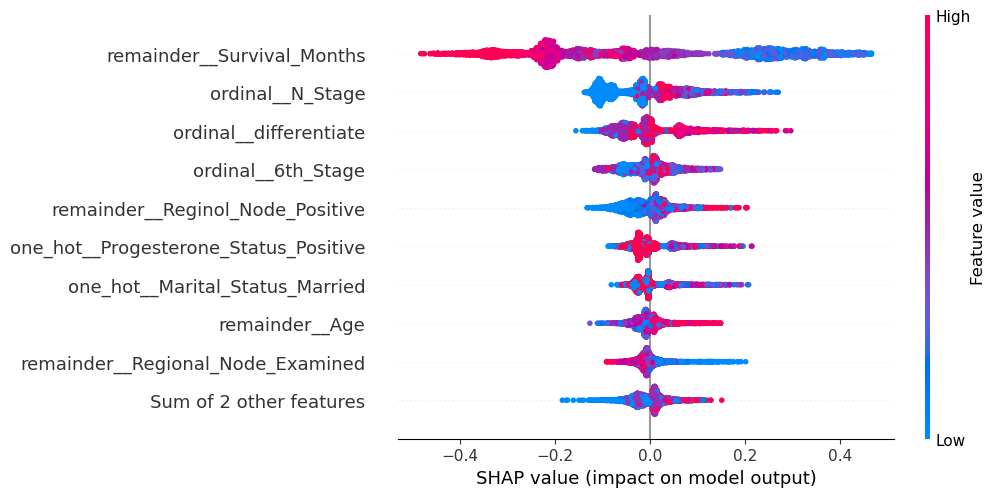

In [ ]:
import shap  

# Get the Random Forest estimator from the stacking classifier
estimator_rf = stack_model.named_estimators_['rf']

# Create a SHAP explainer object for the Random Forest model using the training dataset
# This prepares SHAP to calculate the contribution of each feature to predictions
explainer_rf = shap.Explainer(estimator_rf, X_train_xgb)

# Compute SHAP values for all samples in the training set
# shap_values_rf will contain SHAP values for each feature, for each sample, and for each class (if classification)
shap_values_rf = explainer_rf(X_train_xgb)

# Plot a beeswarm plot of SHAP values for the class with index 1 (usually the positive class)
# The beeswarm plot shows the impact of each feature on the prediction across samples,
# where color represents feature value and position represents SHAP value (importance)
shap.plots.beeswarm(shap_values_rf[:, :, 1])


 96%|=================== | 4143/4320 [00:21<00:00]       

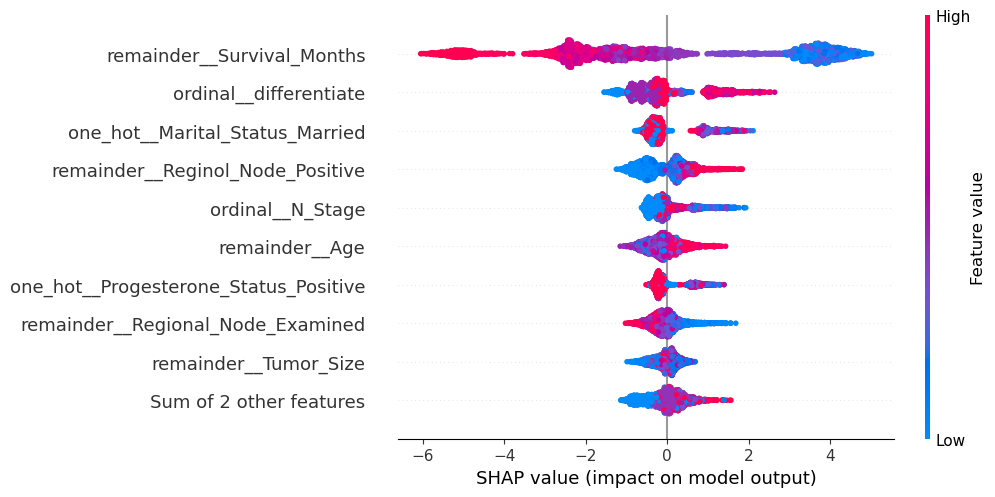

In [ ]:
# Extract the XGBoost classifier from the stacking model by its name 'xgb'
estimator_xgb = stack_model.named_estimators_['xgb']

# Create a SHAP explainer object for the XGBoost model using the training data
# This initializes the SHAP framework to compute feature contributions for this model
explainer_xgb = shap.Explainer(estimator_xgb, X_train_xgb)

# Calculate SHAP values for all samples in the training set
# These values quantify how each feature influences the prediction for each sample
shap_values_xgb = explainer_xgb(X_train_xgb)

# Generate a beeswarm plot to visualize the SHAP values across all features and samples
# The plot shows feature impact on the model output, where color indicates feature value
shap.plots.beeswarm(shap_values_xgb)

In [105]:
for name, model in stack_model.named_estimators_.items():
    if hasattr(model, 'feature_importances_'):
        print(f"Feature importance from {name}:")
        for feature, importance in zip(X_smoteenn.columns, model.feature_importances_):
            print(f"{feature}: {importance}")
        print("\n")


Feature importance from rf:
one_hot__Marital_Status_Married: 0.047137544697609245
one_hot__Progesterone_Status_Positive: 0.05723504347968043
ordinal__T_Stage_: 0.021759227511246197
ordinal__N_Stage: 0.09154596397316372
ordinal__6th_Stage: 0.06801860973600278
ordinal__differentiate: 0.081122974535775
remainder__Age: 0.05787916588402614
remainder__Tumor_Size: 0.04516788204086069
remainder__Regional_Node_Examined: 0.047407989791646225
remainder__Reginol_Node_Positive: 0.06837428706881273
remainder__Survival_Months: 0.4143513112811768


Feature importance from xgb:
one_hot__Marital_Status_Married: 0.08079218119382858
one_hot__Progesterone_Status_Positive: 0.09488501399755478
ordinal__T_Stage_: 0.03712789714336395
ordinal__N_Stage: 0.24990662932395935
ordinal__6th_Stage: 0.09759394079446793
ordinal__differentiate: 0.10152040421962738
remainder__Age: 0.02577250264585018
remainder__Tumor_Size: 0.02142142504453659
remainder__Regional_Node_Examined: 0.024313760921359062
remainder__Reginol_Node_

In [123]:
# Initialize an empty DataFrame to collect feature importance data from each model
df_importances = pd.DataFrame()

# Loop through each base estimator in the stacking model
for name, model in stack_model.named_estimators_.items():
    # Check if the model has the attribute 'feature_importances_' (some models like tree-based have it)
    if hasattr(model, 'feature_importances_'):
        # Create a temporary DataFrame with feature names, their importance scores, and the model name
        temp_df = pd.DataFrame({
            'feature': X_smoteenn.columns,  # Feature names from the training data used
            'importance': model.feature_importances_,  # Corresponding importance values
            'model': name  # Name of the model (e.g., 'rf', 'xgb')
        })
        # Append this temporary DataFrame to the main DataFrame holding all models' importances
        df_importances = pd.concat([df_importances, temp_df], axis=0)

# Import plotly express for easy plotting
import plotly.express as px

# Create a horizontal grouped bar plot to visualize feature importances for each model
fig_fp = px.bar(
    df_importances,
    x='importance',  # Importance values on the x-axis
    y='feature',  # Feature names on the y-axis
    color='model',  # Differentiate bars by model with colors
    orientation='h',  # Horizontal bars
    title='Feature Importances by Model',  # Chart title
    height=600,  # Set the height of the figure for better readability
    color_discrete_map={  # Define specific colors for each model
        'rf': 'forestgreen',
        'xgb': 'darkred'
    }
)

# Adjust layout to group bars side-by-side for each feature, separated by model
fig_fp.update_layout(barmode='group')

# Display the interactive plot
fig_fp.show()


---
# Pipeline con umbral Ajustado

In [124]:
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.base import BaseEstimator, ClassifierMixin

# Custom classifier wrapper that applies a decision threshold to predicted probabilities
class ThresholdClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, model, threshold=0.5):
        """
        Initialize with:
        - model: any sklearn-like classifier with predict_proba method
        - threshold: probability cutoff to assign class label 1
        """
        self.model = model
        self.threshold = threshold

    def fit(self, X, y):
        """
        Fit the wrapped model on training data.
        """
        self.model.fit(X, y)
        return self  # Return self to allow chaining

    def predict(self, X):
        """
        Predict class labels by applying the threshold on the probability
        of the positive class (class 1).
        """
        proba = self.model.predict_proba(X)[:, 1]  # Get probabilities for class 1
        return (proba >= self.threshold).astype(int)  # Apply threshold and return labels

    def predict_proba(self, X):
        """
        Return the predicted probabilities from the wrapped model.
        """
        return self.model.predict_proba(X)

    def score(self, X, y):
        """
        Use the wrapped model's score method (default accuracy).
        """
        return self.model.score(X, y)


In [125]:
# Define a pipeline using imblearn's Pipeline to handle imbalanced data and custom steps
pipeline_T = ImbPipeline(steps=[
    # Step 1: Apply Winsorization to numerical columns to limit extreme outliers
    ('winsor', Winsorizer(columns=num_cols, limits=(0.01, 0.01))),

    # Step 2: Preprocessing step, usually includes transformations like scaling, encoding, etc.
    ('preprocessing', preprocessor),

    # Step 3: Feature selection using Recursive Feature Elimination (RFE) with a Random Forest estimator
    # Selects the best_num_features most important features based on rf_1 model
    ('feature_selection', RFESelector(estimator=rf_1, n_features_to_select=best_num_features)),

    # Step 4: Resample data to handle class imbalance with SMOTEENN (combines oversampling and cleaning)
    ('resampling', smoteenn),

    # Step 5: Classification using the ThresholdClassifier wrapper around the stacked model
    # Applies a custom threshold of 0.8 for predicting positive class
    ('model', ThresholdClassifier(model=stack_model, threshold=0.8))
])

# Fit the entire pipeline on the training data (X_train2, y_train2)
pipeline_T.fit(X_train2, y_train2)

# Predict labels on the test data (X_test2)
y_pred_2 = pipeline_T.predict(X_test2)

# Convert predicted numeric labels back to original labels using the label encoder
y_pred_2 = label_encoder.inverse_transform(y_pred_2)

# Print classification metrics and confusion matrix comparing true vs predicted labels
print(classification_report(y_test2, y_pred_2), confusion_matrix(y_test2, y_pred_2))


              precision    recall  f1-score   support

       Alive       0.93      0.93      0.93       682
        Dead       0.61      0.61      0.61       123

    accuracy                           0.88       805
   macro avg       0.77      0.77      0.77       805
weighted avg       0.88      0.88      0.88       805
 [[635  47]
 [ 48  75]]


In [ ]:
import pickle

# Open (or create) a file named "pipelin_stack_VF.pkl" in write-binary mode
with open("pipelin_stack_VF.pkl", "wb") as f:
    # Serialize and save the pipeline_VF object into the file
    pickle.dump(pipeline_VF, f)
